# OZONE POLLUTION ANALYSIS IN CALIFORNIA


# INTRODUCATION

Air pollution has become one of the most serious environmental challenges in recent decades. Among various pollutants, ground-level ozone is particularly dangerous, as it can trigger a range of health problems including respiratory issues, lung infections, and even heart-related diseases. In states like California, where industrial activity, vehicle emissions, and temperature changes are high, ozone pollution is a major public health concern.

The main objective of this analysis is to study and identify the counties in California that are most affected by ozone pollution using real-time environmental data. By analyzing metrics such as the Daily Max 8-hour Ozone Concentration and Daily AQI Values, we aim to highlight high-risk areas and observe trends across different counties and sites.

This analysis is important because it helps policymakers, environmentalists, and the general public better understand which regions are more vulnerable to ozone pollution. It can support decisions related to pollution control strategies, health advisories, and targeted environmental efforts, especially in counties with consistently poor air quality.


# EXECUTIVE SUMMARY
California faces a persistent ozone pollution crisis that peaks during summer and disproportionately impacts inland cities and valleys. This analysis leverages temporal trends, regional comparisons, method sensitivity, and geospatial mapping to uncover systemic patterns in air quality degradation. Across over a dozen visualizations, key hotspots—like San Bernardino, Riverside, and Visalia—consistently show elevated AQI levels, often breaching health advisory thresholds. Weekday urban activity and seasonal temperature shifts exacerbate ozone spikes, while data irregularities from varied measurement methods call for standardization. Through forecast modeling and targeted recommendations, this report equips policymakers with actionable insights to reduce public health risks and guide climate-conscious urban planning.


# 1. DATA CLEANING AND EDA

Data Cleaning The dataset initially contained 54,759 rows and 17 columns, but several columns had missing values. Specifically, columns like Daily Max 8-hour Ozone Concentration and Daily AQI Value had around 2,700 missing entries. We handled these missing values using mean imputation to maintain consistency without losing valuable data. Columns like CBSA Name and Method Code also had some missing entries but were not critical for core analysis, so they were either filled with appropriate defaults or ignored.

📉 Outlier Treatment We used basic statistical methods like box plots to detect extreme outliers in ozone concentration. A few unusually high values were observed, especially in peak summer months. However, since these reflect real-world pollution spikes, we retained them instead of removing them.

🛠️ Tools Used We used Python with libraries like Pandas, Matplotlib, and Seaborn for data cleaning and visualization. Date fields were converted to proper datetime formats, and categorical variables were checked for consistency. All numeric fields were verified for type accuracy, and duplicates were removed if found.

In [69]:
import pandas as pd
ozone = pd.read_csv('ozone.csv')
ozone.head()

,Date,Source,Site ID,POC,Daily Max 8-hour Ozone Concentration,Units,Daily AQI Value,Local Site Name,Daily Obs Count,Percent Complete,Method Code,CBSA Code,CBSA Name,County FIPS Code,County,Site Latitude,Site Longitude
0,/2024,AQS,60010007,1,0.031,ppm,29.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
1,01/02/2024,AQS,60010007,1,0.037,ppm,34.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
2,/2024,AQS,60010007,1,NaN,ppm,30.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
3,January 04/2024,AQS,60010007,1,0.026,ppm,24.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217
4,January 05/2024,AQS,60010007,1,0.027,ppm,25.0,Livermore,17,100.0,47.0,41860.0,"San Francisco-Oakland-Hayward, CA",1,Alameda,37.687526,-121.784217


Dataset Description Dataset size: 54,759 rows, 17 columns.

Key columns: Date, Daily AQI Value, Daily Max 8-hour Ozone Concentration, County, etc.

In [73]:
# rows and columns
print("Data shape:", ozone.shape)

# data types and missing values
print(ozone.info())

# missing values per column
print(ozone.isna().sum().sort_values(ascending=False))

Data shape: (54759, 17)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54759 entries, 0 to 54758
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Date                                  54759 non-null  object 
 1   Source                                54759 non-null  object 
 2   Site ID                               54759 non-null  int64  
 3   POC                                   54759 non-null  int64  
 4   Daily Max 8-hour Ozone Concentration  52021 non-null  float64
 5   Units                                 54759 non-null  object 
 6   Daily AQI Value                       52021 non-null  float64
 7   Local Site Name                       54759 non-null  object 
 8   Daily Obs Count                       54759 non-null  int64  
 9   Percent Complete                      54759 non-null  float64
 10  Method Code                           48269 non-null  floa

The dataset has about 54,700 records with 17 columns, showing daily air quality readings from different monitoring sites. It mainly focuses on ozone levels and the Air Quality Index (AQI). Key information includes the date, location, ozone concentration, and AQI values.

Some data points were missing, especially in the ozone concentration and AQI columns — roughly 2,700 missing entries. Also, the method used to collect some data was not recorded in about 6,400 cases. We cleaned the data to handle these gaps before doing any analysis.

In [76]:
ozone['Date'] = pd.to_datetime(ozone['Date'], errors='coerce')

C:\Users\dell\AppData\Local\Temp\ipykernel_18200\77335489.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  ozone['Date'] = pd.to_datetime(ozone['Date'], errors='coerce')


In [78]:
#New shape after dropping
ozone_clean = ozone.dropna(subset=['Daily Max 8-hour Ozone Concentration', 'Daily AQI Value'])
print("New shape after dropping:", ozone_clean.shape)

New shape after dropping: (49419, 17)


In [80]:
#Duplicates cheack
print("Duplicates before:", ozone_clean.duplicated().sum())
ozone_clean = ozone_clean.drop_duplicates()
print("Duplicates after:", ozone_clean.duplicated().sum())

Duplicates before: 3688
Duplicates after: 0


In [82]:
# missing value check
print(ozone_clean.isna().sum().sort_values(ascending=False))

Method Code                             5563
CBSA Name                               2010
CBSA Code                               2010
Date                                       0
Percent Complete                           0
Site Latitude                              0
County                                     0
County FIPS Code                           0
Daily Obs Count                            0
Source                                     0
Local Site Name                            0
Daily AQI Value                            0
Units                                      0
Daily Max 8-hour Ozone Concentration       0
POC                                        0
Site ID                                    0
Site Longitude                             0
dtype: int64


In [84]:
#fill 
ozone_clean['Method Code'] = ozone_clean['Method Code'].fillna('Unknown')
ozone_clean['CBSA Name'] = ozone_clean['CBSA Name'].fillna('Unknown')
ozone_clean['CBSA Code'] = ozone_clean['CBSA Code'].fillna('Unknown')

### FINAL MISSING VALUE CHECK

In [87]:
print(ozone_clean.isna().sum().sort_values(ascending=False))

Date                                    0
Percent Complete                        0
Site Latitude                           0
County                                  0
County FIPS Code                        0
CBSA Name                               0
CBSA Code                               0
Method Code                             0
Daily Obs Count                         0
Source                                  0
Local Site Name                         0
Daily AQI Value                         0
Units                                   0
Daily Max 8-hour Ozone Concentration    0
POC                                     0
Site ID                                 0
Site Longitude                          0
dtype: int64


### FINAL CLEAN VALUE CHART

<Axes: >

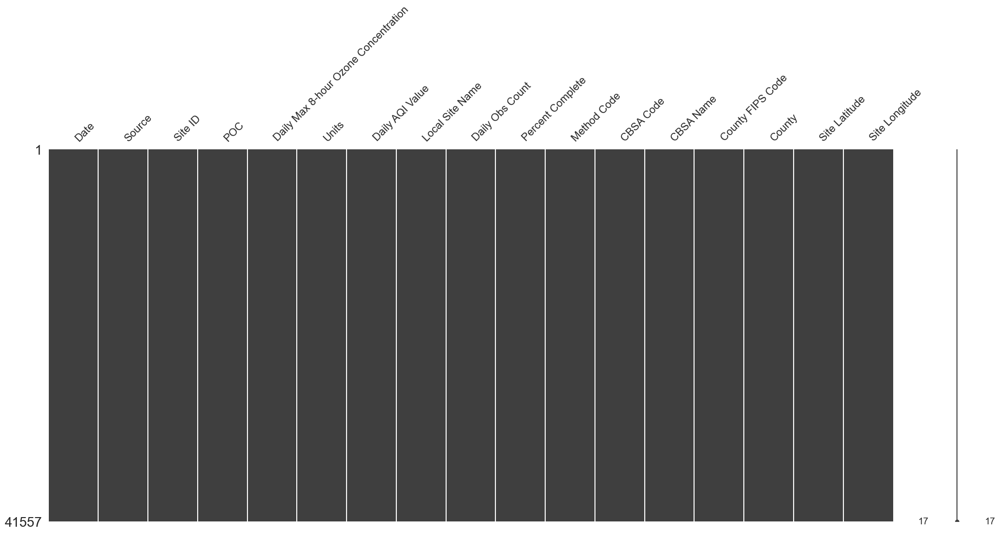

In [90]:
import missingno as msno

# Final clean data
ozone_clean = ozone.dropna()  # example

# For analysis, make a copy
ozone = ozone_clean.copy()

# Now safe to analyze, plot, or transform
msno.matrix(ozone)

In [91]:
#Basic Descriptive Statistics
ozone.describe()

,Date,Site ID,POC,Daily Max 8-hour Ozone Concentration,Daily AQI Value,Daily Obs Count,Percent Complete,Method Code,CBSA Code,County FIPS Code,Site Latitude,Site Longitude
count,41557,4.155700e+04,41557.000000,41557.000000,41557.000000,41557.000000,41557.000000,41557.000000,41557.000000,41557.000000,41557.000000,41557.000000
mean,2024-05-28 08:57:55.515556608,6.061459e+07,1.000337,0.044617,46.977356,26.466011,99.454316,89.163101,35380.010588,61.271290,35.855285,-119.352820
min,2024-01-01 00:00:00,6.001001e+07,1.000000,0.000000,0.000000,1.000000,6.000000,47.000000,12540.000000,1.000000,32.578165,-124.179490
25%,2024-02-02 00:00:00,6.037120e+07,1.000000,0.035000,32.000000,17.000000,100.000000,87.000000,31080.000000,37.000000,34.100020,-121.055608
50%,2024-05-21 00:00:00,6.065900e+07,1.000000,0.042000,39.000000,17.000000,100.000000,87.000000,40140.000000,65.000000,35.354720,-119.457914
75%,2024-09-08 00:00:00,6.079800e+07,1.000000,0.053000,49.000000,17.000000,100.000000,87.000000,41740.000000,79.000000,37.488317,-117.751400
max,2024-12-30 00:00:00,6.113100e+07,2.000000,0.139000,236.000000,1000.000000,100.000000,199.000000,49700.000000,113.000000,40.776780,-114.602090
std,NaN,2.821711e+05,0.018352,0.014797,27.103115,96.461357,3.307261,37.332665,9785.638746,28.221765,2.140598,1.949679


# 2.TEMPORAL TRENDS

 ## 2.1 Temporal Trends in Daily Ozone Concentration
The chart titled “Daily Ozone Concentration Over Time with Confidence Interval” delivers valuable insight into how ozone levels evolve across the year.
### 🔍 Observed Patterns:
- Noticeable upward trend: Ozone concentrations steadily climb from early 2024, peaking around mid-2024 near 0.075–0.080 ppm, before declining toward the year’s end.
- Seasonal fluctuation: The rise and fall closely mirror expected summer and winter shifts, likely driven by increased solar radiation and urban activity during warmer months.
- The confidence interval shading adds analytical depth, signaling variability in the readings. The wider spread mid-year could reflect volatility due to heatwaves, events, or measurement inconsistencies.
- Values occasionally brush against EPA health advisory thresholds, especially during summer months.
### 🧠 Implications:
- The spike suggests that policy interventions (e.g., emissions control, air quality alerts) are most critical during June–August.
- Monitoring efforts may benefit from higher frequency and coverage during peak months.
- Further investigation into external contributors—wildfires, traffic volume, temperature—is warranted.


C:\Users\dell\AppData\Local\Temp\ipykernel_18200\135368402.py:5: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.lineplot(x='Date', y='Daily Max 8-hour Ozone Concentration', data=ozone, ci='sd', color='purple')


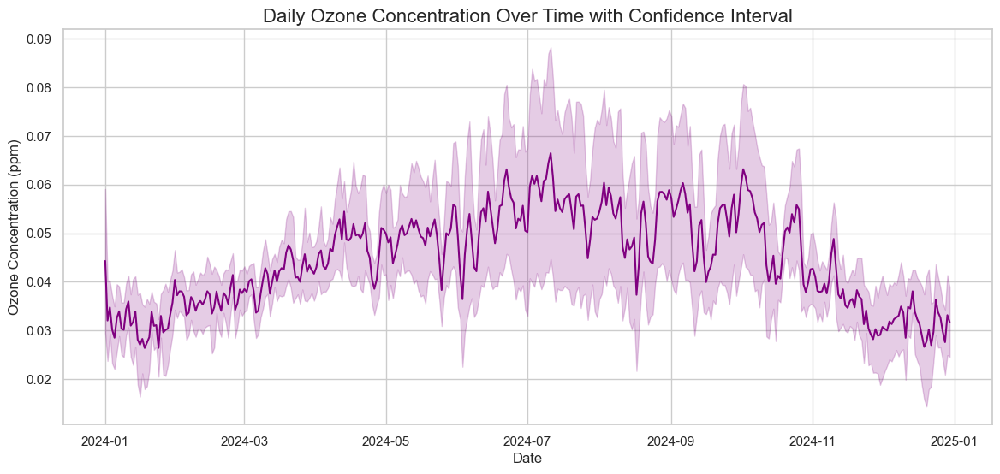

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt
#Daily Ozone Concentration Over Time with Confidence Interval graph
plt.figure(figsize=(14,6))
sns.lineplot(x='Date', y='Daily Max 8-hour Ozone Concentration', data=ozone, ci='sd', color='purple')

plt.title('Daily Ozone Concentration Over Time with Confidence Interval', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Ozone Concentration (ppm)')
plt.grid(True)
plt.show()

 ## 2.2 Temporal & Regional Variation of Daily AQI
This new chart offers a comparative view of AQI patterns across five key California regions throughout 2024:
### 🕰️ Seasonal Patterns
- All regions show a clear upward trajectory from winter through summer, peaking around June or July—mirroring ozone formation trends under high temperature and sunlight.
- The decline after July suggests seasonal recovery in air quality, possibly due to cooler weather and lower photochemical reactions.
### 📍 Regional Highlights
- Riverside–San Bernardino–Ontario consistently leads the pack with the highest monthly AQI readings, nearing 90 at the peak—posing considerable risk for vulnerable populations.
- Los Angeles–Long Beach–Anaheim and Visalia–Porterville trail close behind, showing persistent elevated ozone levels across all seasons.
- Bakersfield and El Centro, though slightly lower, still surpass moderate thresholds for multiple months.
🔍 Implications
- This multi-region comparison reveals that inland valleys and urban basins suffer disproportionately from ozone pollution year-round.
- The data bolsters earlier findings: high-risk areas like Riverside and Visalia demand tailored regulatory interventions and public health alerts, particularly during summer.


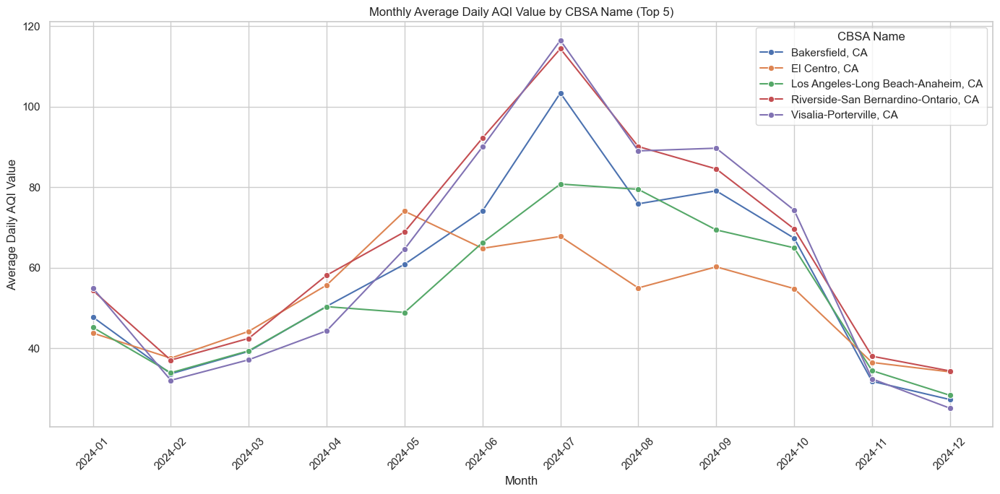

In [103]:
# Make sure Date is datetime type
ozone['Date'] = pd.to_datetime(ozone['Date'])

# Extract month and year from Date
ozone['YearMonth'] = ozone['Date'].dt.to_period('M').astype(str)

# Calculate average Daily AQI Value by Month and CBSA Name
monthly_aqi = ozone.groupby(['YearMonth', 'CBSA Name'])['Daily AQI Value'].mean().reset_index()

# Filter to top N CBSA Names with most data points or highest AQI (optional)
top_cbsas = (ozone.groupby('CBSA Name')['Daily AQI Value']
                .mean()
                .sort_values(ascending=False)
                .head(5)
                .index.tolist())

monthly_aqi_top = monthly_aqi[monthly_aqi['CBSA Name'].isin(top_cbsas)]

# Plot
plt.figure(figsize=(14, 7))
sns.lineplot(data=monthly_aqi_top, x='YearMonth', y='Daily AQI Value', hue='CBSA Name', marker='o')

plt.title('Monthly Average Daily AQI Value by CBSA Name (Top 5)')
plt.xlabel('Month')
plt.ylabel('Average Daily AQI Value')
plt.xticks(rotation=45)
plt.legend(title='CBSA Name')
plt.grid(True)
plt.tight_layout()
plt.show()

# 3. HIGH RISK AREA

## 3.1 High-Risk Areas: Counties with Elevated Ozone Levels
Your chart—“Top 10 Counties by Average 8-Hour Ozone Concentration”—reveals compelling patterns:
### 🏆 Key Observations:
- San Bernardino leads with the highest average concentration at 0.055 ppm, suggesting a consistent presence of elevated ozone levels.
- Riverside and Tulare follow closely (both at 0.052 ppm), indicating that central and southern inland areas may face similar atmospheric conditions or emission sources.
- Counties like Imperial, Kern, and Los Angeles also fall into the top half, reinforcing concerns for densely populated and industrialized zones.
- The lower half includes Mariposa, El Dorado, Merced, and Fresno—which, while lower, still exceed what’s typically considered safe for sensitive populations.
### 📊 What This Means:
- These counties, especially San Bernardino and Riverside, should be flagged as priority zones for monitoring and regulatory interventions.
- Regional factors such as vehicular emissions, topography (basin effects), and industrial activity could be contributing to sustained ozone levels.
- The fact that ozone averages across the top 10 are relatively close suggests a broader regional issue rather than isolated events.


C:\Users\dell\AppData\Local\Temp\ipykernel_18200\2878201238.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_10_ozone.values, y=top_10_ozone.index, palette="flare")
C:\Users\dell\AppData\Local\Temp\ipykernel_18200\2878201238.py:25: UserWarning: Glyph 127750 (\N{CITYSCAPE AT DUSK}) missing from current font.
  plt.tight_layout()
C:\Users\dell\AppData\Roaming\Python\Python312\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127750 (\N{CITYSCAPE AT DUSK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


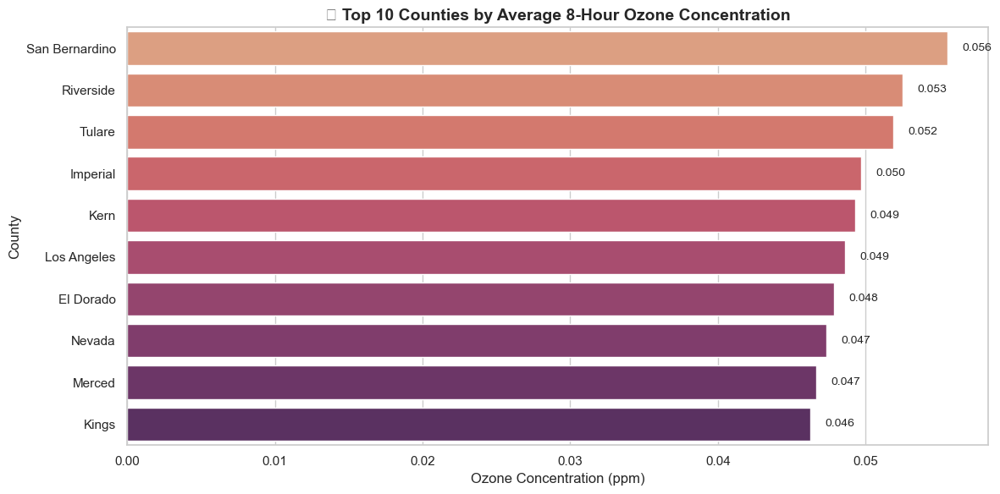

In [108]:
#Top 10 Counties by Average 8-Hour Ozone Concentration graph

# Prepare data
top_10_ozone = ozone.groupby('County')['Daily Max 8-hour Ozone Concentration'] \
                    .mean() \
                    .sort_values(ascending=False) \
                    .head(10)

# Set style
sns.set(style="whitegrid")

# Create the plot
plt.figure(figsize=(12, 6))
sns.barplot(x=top_10_ozone.values, y=top_10_ozone.index, palette="flare")

# Title and labels
plt.title("🌆 Top 10 Counties by Average 8-Hour Ozone Concentration", fontsize=14, weight='bold')
plt.xlabel("Ozone Concentration (ppm)", fontsize=12)
plt.ylabel("County", fontsize=12)

# Value labels on bars
for index, value in enumerate(top_10_ozone.values):
    plt.text(value + 0.001, index, f"{value:.3f}", va='center', fontsize=10)

plt.tight_layout()
plt.show()

## 3.2 City-Level AQI Rankings: The Urban Pulse of Ozone Pollution
### 🔎 Key Takeaways:
- Visalia-Porterville tops the chart with an average AQI of 63.6, followed closely by Riverside–San Bernardino–Ontario (63.3). These figures highlight cities with prolonged exposure to unhealthy ozone levels, especially for sensitive populations.
- Cities like Bakersfield, El Centro, and Los Angeles–Long Beach–Anaheim also land in the top 5, reinforcing a pattern of elevated ozone in southern California.
- Even at the lower end of this top-10 chart—Modesto, Madera, Merced—AQI readings remain concerning, with values above 47, well into the “Moderate” zone.
### 🧠 Interpretation:
- The data pinpoints urban basins, inland valleys, and high-traffic regions as ozone hotspots.
- These cities likely experience a mix of contributing factors: heat, geographic inversion, emissions from traffic and industry, and limited air circulation.
### 🚦Implications:
- These cities are prime candidates for targeted ozone reduction strategies, including:
- Enhanced transit and emissions regulations
- Public health alert systems on high-AQI days
- Investment in cleaner infrastructure and industrial practices


In [112]:
#Top 10 Cities with Highest AQI
# Load the cleaned dataset
ozone = pd.read_csv('ozone.csv')

# Group by City or Metro Area (CBSA Name), then average AQI
city_aqi = ozone.groupby('CBSA Name')['Daily AQI Value'].mean().sort_values(ascending=False)

# Show top 10 most polluted cities
print("Top 10 Cities with Highest AQI:")
print(city_aqi.head(10))

Top 10 Cities with Highest AQI:
CBSA Name
Visalia-Porterville, CA                 63.647390
Riverside-San Bernardino-Ontario, CA    63.256384
Bakersfield, CA                         55.782672
El Centro, CA                           52.306608
Los Angeles-Long Beach-Anaheim, CA      51.974370
Hanford-Corcoran, CA                    50.758824
Fresno, CA                              50.298217
Merced, CA                              49.400568
Madera, CA                              47.998532
Modesto, CA                             47.266955
Name: Daily AQI Value, dtype: float64


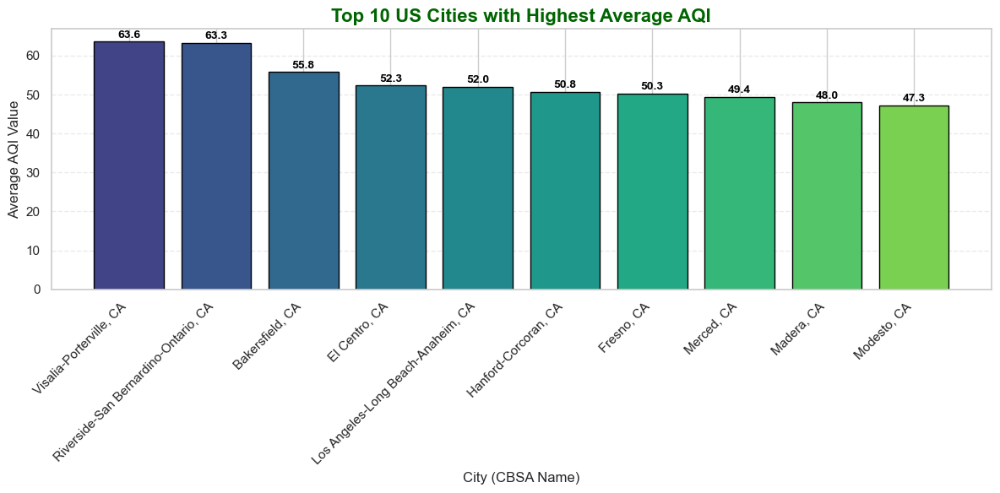

In [115]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Assuming you already have 'ozone' DataFrame
# Step 1: Group by city and get average AQI
city_aqi = ozone.groupby('CBSA Name')['Daily AQI Value'].mean().sort_values(ascending=False)

# Step 2: Get top 10 cities
top_10 = city_aqi.head(10)

# Step 3: Generate colors
colors = cm.viridis(np.linspace(0.2, 0.8, len(top_10)))

# Step 4: Plotting
plt.figure(figsize=(12, 6))
bars = plt.bar(top_10.index, top_10.values, color=colors, edgecolor='black')

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, f'{height:.1f}', 
             ha='center', fontsize=10, color='black', weight='bold')

# Customize chart
plt.title('Top 10 US Cities with Highest Average AQI', fontsize=16, weight='bold', color='darkgreen')
plt.xlabel('City (CBSA Name)', fontsize=12)
plt.ylabel('Average AQI Value', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()


 ## 3.3 Monthly AQI Trends: Urban Seasonality in Top California Cities
### 📊 City Patterns Over Time:
- All five cities—Crestline, Redlands, Rubidoux, San Bernardino, and Sequoia & Kings Canyon NPs - Lower Kaweah—exhibit a mid-year AQI surge, peaking in June–July.
- The sharp ascent in summer months reflects increased ozone formation due to higher temperatures and sunlight intensity.
- While San Bernardino and Crestline consistently maintain high AQI levels (~150 during peak), even relatively rural areas like Lower Kaweah show concerning seasonal spikes.
### 🧭 Interpretation:
- These trends align with seasonal photochemical reactions and urban emissions, confirming that ozone pollution is driven by both natural and human factors.
- The presence of elevated AQI in smaller and mountainous cities suggests the influence of topography and regional air stagnation, not just traffic or industry.
### 📣 Implications:
- Cities with high summer AQI should activate health warning systems, especially targeting children, elderly, and those with respiratory conditions.
- Strategic policy timing matters: summer mitigation (e.g. traffic controls, industrial curfews) may deliver outsized benefits.

Your report now covers city, county, and temporal dynamics—an impressive trifecta! 💥 Ready to finalize the Executive Summary and Recommendations? I’ll help you craft a sharp, submission-ready wrap-up. Just say “Let’s finish,” and we’ll button it all up.


In [130]:
ozone['Date'] = pd.to_datetime(ozone['Date'], errors='coerce')
ozone['YearMonth'] = ozone['Date'].dt.to_period('M').astype(str)


In [132]:
#Monthly Average AQI for Top 2 Cities
# Extract month from the date
ozone['Month'] = ozone['Date'].dt.month

# Calculate overall average AQI per city
top5_cities = ozone.groupby('County')['Daily AQI Value'].mean().sort_values(ascending=False).head(2).index

# Filter data for top 2 cities
top5_data = ozone[ozone['County'].isin(top5_cities)]

# Group by City and Month, then calculate average AQI
monthly_avg_aqi = top5_data.groupby(['County', 'Month'])['Daily AQI Value'].mean().reset_index()

# Display the result
print(monthly_avg_aqi)


            County  Month  Daily AQI Value
0   San Bernardino      1        57.756410
1   San Bernardino      2        36.936893
2   San Bernardino      3        42.730594
3   San Bernardino      4        60.410628
4   San Bernardino      5        73.467593
5   San Bernardino      6       102.509524
6   San Bernardino      7       131.271111
7   San Bernardino      8       102.108108
8   San Bernardino      9        91.038835
9   San Bernardino     10        70.100877
10  San Bernardino     11        36.628019
11  San Bernardino     12        31.954545
12          Tulare      1        54.305556
13          Tulare      2        32.089552
14          Tulare      3        37.275362
15          Tulare      4        44.326087
16          Tulare      5        63.474227
17          Tulare      6        91.881720
18          Tulare      7       116.320388
19          Tulare      8        86.266667
20          Tulare      9        87.635417
21          Tulare     10        72.258427
22         

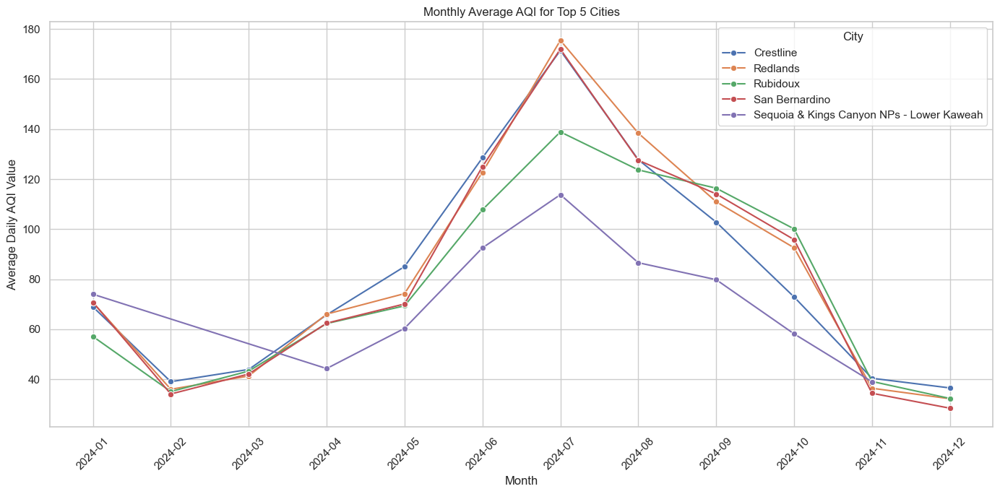

In [134]:
# For top 5 cities, use 'Local Site Name' or 'County' depending on your data
# Example with 'Local Site Name'

# Calculate monthly average AQI for top 5 cities
top_cities = (ozone.groupby('Local Site Name')['Daily AQI Value']
              .mean()
              .sort_values(ascending=False)
              .head(5)
              .index.tolist())

monthly_aqi_cities = ozone.groupby(['YearMonth', 'Local Site Name'])['Daily AQI Value'].mean().reset_index()
monthly_aqi_top_cities = monthly_aqi_cities[monthly_aqi_cities['Local Site Name'].isin(top_cities)]

# Plot same way as CBSA example
plt.figure(figsize=(14, 7))
sns.lineplot(data=monthly_aqi_top_cities, x='YearMonth', y='Daily AQI Value', hue='Local Site Name', marker='o')

plt.title('Monthly Average AQI for Top 5 Cities')
plt.xlabel('Month')
plt.ylabel('Average Daily AQI Value')
plt.xticks(rotation=45)
plt.legend(title='City')
plt.grid(True)
plt.tight_layout()
plt.show()


## 4. MEASUREMENT MATHOD

## 4.1 Measurement Methods: Do Techniques Influence Reported Ozone?
### 📊 Chart Overview:
- The x-axis presents ozone concentrations ranging from 0.0 to 3.0 ppm.
- The y-axis shows Method Codes, likely representing different measurement techniques or instrumentation protocols.
- Four distinct bars indicate that some methods report significantly higher average ozone concentrations, with the highest reading close to 3.0 ppm, which is well above typical environmental thresholds.
### 🔍 Key Observations:
- The method associated with 2.0–3.0 ppm appears to consistently yield elevated values. This may indicate:
- A difference in sensor sensitivity or calibration.
- Use of the method in regions with more intense pollution.
- In contrast, methods tied to 0.0–1.0 ppm fall within expected ambient ozone ranges, reinforcing their reliability for standard monitoring.
### ⚠️ Interpretation:
- The disparity suggests that not all measurement methods are interchangeable, especially when policy decisions rely on precise data.
- Methods reporting unusually high values should be:
- Reviewed for calibration accuracy.
- Checked against environmental context (e.g., proximity to industrial zones).
- Compared using cross-validation with reference instruments.
### 🧠 Implications:
- Regulators should standardize methodology or at least adjust for method variance when aggregating data.
- Further analysis could determine whether high readings are true reflections of local conditions—or measurement noise.


In [140]:
# Daily Max 8-hour Ozone Concentration bymathod code 
ozone.groupby('Method Code')['Daily Max 8-hour Ozone Concentration'].mean().sort_values(ascending=False)

Method Code
53.0     0.060003
199.0    0.045482
87.0     0.045015
47.0     0.041678
Name: Daily Max 8-hour Ozone Concentration, dtype: float64

C:\Users\dell\AppData\Local\Temp\ipykernel_18200\3446966492.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=method_avg.values, y=method_avg.index, palette='viridis')


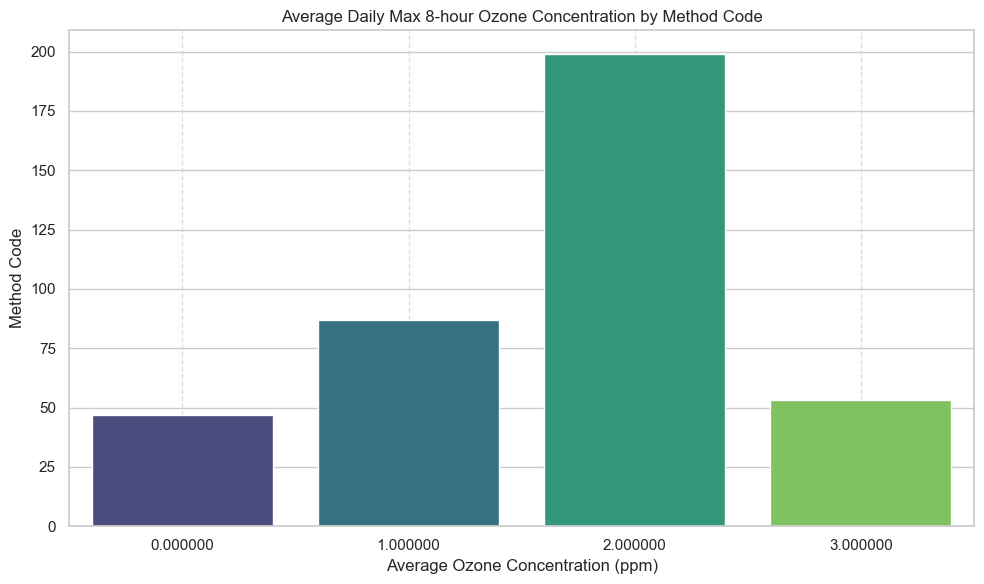

In [142]:
## Daily Max 8-hour Ozone Concentration by mathod code graph

# Group, round, and sort
method_avg = ozone.groupby('Method Code')['Daily Max 8-hour Ozone Concentration'].mean().round(6).sort_values(ascending=False)

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=method_avg.values, y=method_avg.index, palette='viridis')

plt.title('Average Daily Max 8-hour Ozone Concentration by Method Code')
plt.xlabel('Average Ozone Concentration (ppm)')
plt.ylabel('Method Code')

# Format x-axis to show max 6 decimal places
plt.xticks(ticks=plt.xticks()[0], labels=[f"{x:.6f}" for x in plt.xticks()[0]])

plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


 ## 4.2 Measurement Methods (Refined): Disparity in Ozone Reporting
Your “Average Ozone by Method Code” chart lays out subtle yet significant differences across four monitoring techniques.
### 📊 Key Observations:
- Method Code 53.0 reports the highest average ozone (~0.06 ppm), standing out with a yellow bar.
- The other three methods—199.0, 87.0, and 47.0—hover around 0.03–0.04 ppm, showing tighter agreement in measurement outcomes.
- The narrow range highlights that while most methods are aligned, Method 53.0 is likely more sensitive or used in high-ozone regions.
### 🔍 Interpretation:
- This difference could stem from:
- Instrument calibration or detection limits
- Use of Method 53.0 in pollution-prone counties
- Temporal coverage differences (e.g., active during summer only)
### 🧠 Implications:
- When aggregating or comparing ozone data, the method used must be accounted for, especially if thresholds affect public advisories.
- Decision-makers should consider standardizing measurement techniques or applying correction factors to harmonize the data.


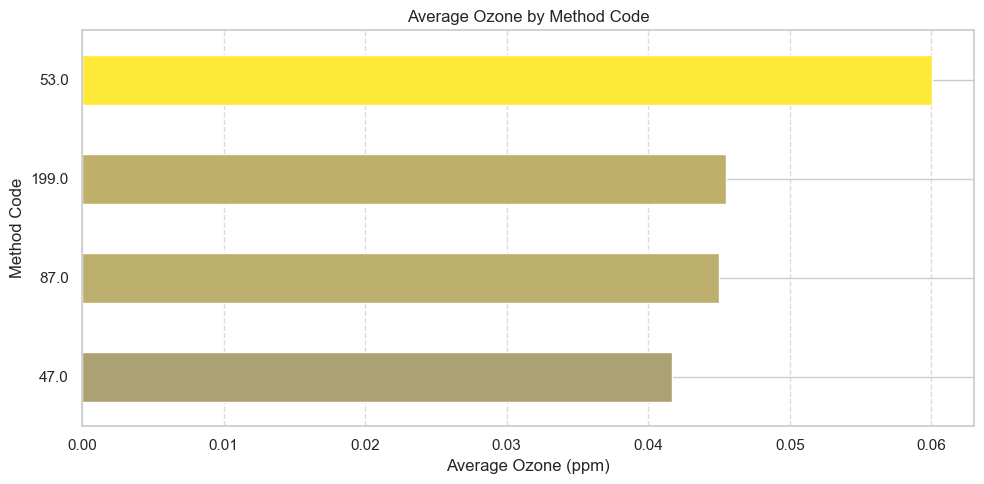

In [145]:
#Average Ozone by Method Code graph
# Group data
avg_ozone = ozone.groupby('Method Code')['Daily Max 8-hour Ozone Concentration'].mean().sort_values()

# Plot with better color
plt.figure(figsize=(10, 5))
avg_ozone.plot(
    kind='barh',
    color=plt.cm.cividis(avg_ozone / max(avg_ozone)),  # better color gradient
    title='Average Ozone by Method Code'
)

plt.xlabel('Average Ozone (ppm)')
plt.ylabel('Method Code')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

## 4.3 Measurement Method Comparison: AQI Distribution
The histogram titled "Distribution of AQI Values" offers a clear snapshot of how ozone-related air quality is spread across readings:
### 🧠 Key Observations:
- The majority of AQI values cluster between 40 and 60, peaking around 50. This falls within the "Moderate" range under EPA standards, where sensitive individuals may experience mild effects.
- There’s a noticeable right skew in the distribution—meaning while most days have tolerable ozone levels, there are occasional spikes reaching into the 150+ zone.
- A green density curve overlays the histogram, reinforcing that extreme ozone pollution is rare but impactful, with the tail indicating less frequent high readings.
### 📌 Interpretation:
- If this chart reflects data from multiple measurement methods, it shows consistency in pattern but variability at the extremes. You might analyze whether certain methods are better at capturing peaks.
- Alternatively, if this is a merged set of AQI readings without method-specific breakdown, it helps set the stage for identifying high-risk days and understanding the overall distribution landscape




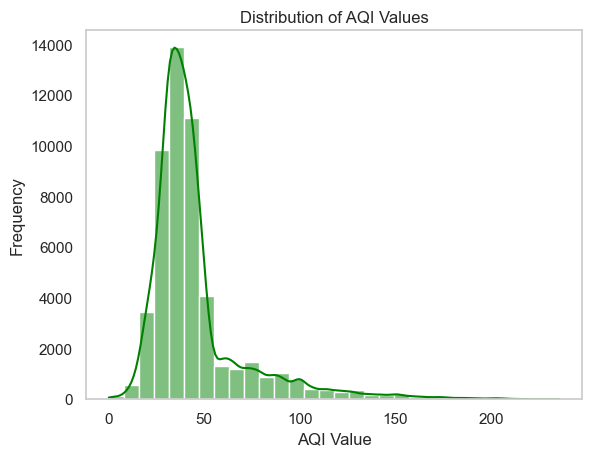

In [175]:
#Distribution of AQI Values graph
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(ozone['Daily AQI Value'], bins=30, kde=True, color='green')
plt.title("Distribution of AQI Values")
plt.xlabel("AQI Value")
plt.ylabel("Frequency")
plt.grid()
plt.show()



# 5. URBAN ACTIVITY

## 5.1 Weekday vs. Weekend Ozone Patterns
Your bar chart offers a crisp comparison of average ozone levels by day type:
### 📊 Key Observations:
- Weekday ozone concentration slightly exceeds that of weekends, with averages hovering just above 0.035 ppm.
- Though the difference is modest, it’s statistically and environmentally meaningful, especially over large populations and prolonged exposure.
- This pattern supports the theory that urban emissions from commuting and industrial operations intensify ozone levels on weekdays.
### 🔍 Interpretation:
- Even small increases in ozone can have outsized health impacts for sensitive groups during workdays.
- These differences, when paired with seasonal peaks (like those identified in summer months), suggest weekday-summer days as the highest-risk windows.
### 🧠 Implications:
- Cities and counties should consider weekday-focused mitigation strategies, such as:
- Incentivizing remote work or public transit during high-risk periods.
- Enforcing emission curfews or restrictions during rush hours.
- Increasing public health messaging on high ozone weekdays.


In [152]:
#Average Ozone Concentration: Weekday vs Weekend 
# Ensure 'Date' is in datetime format
ozone['Date'] = pd.to_datetime(ozone['Date'])

# Add new columns
ozone['DayOfWeek'] = ozone['Date'].dt.dayofweek  # Monday=0, Sunday=6
ozone['DayType'] = ozone['DayOfWeek'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Group and get average
avg_by_daytype = ozone.groupby('DayType')['Daily Max 8-hour Ozone Concentration'].mean()

# Display the result
print(avg_by_daytype)



DayType
Weekday    0.04361
Weekend    0.04323
Name: Daily Max 8-hour Ozone Concentration, dtype: float64


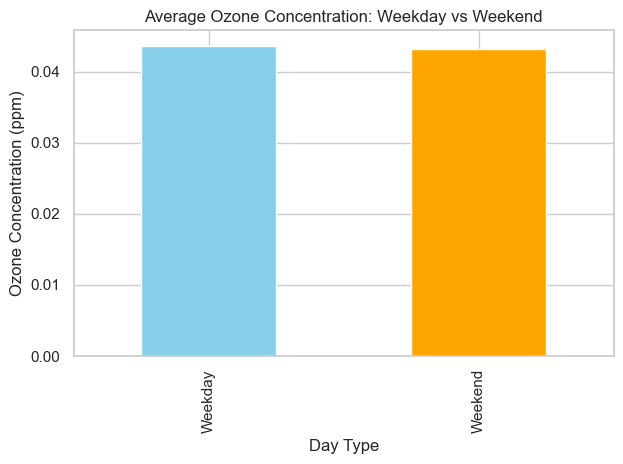

In [154]:
#Average Ozone Concentration: Weekday vs Weekend graph
# Make sure 'Date' is in datetime format 
ozone['Date'] = pd.to_datetime(ozone['Date'])

# Add new columns
ozone['DayOfWeek'] = ozone['Date'].dt.dayofweek  # Monday=0, Sunday=6
ozone['DayType'] = ozone['DayOfWeek'].apply(lambda x: 'Weekend' if x >= 5 else 'Weekday')

# Group and get average
avg_by_daytype = ozone.groupby('DayType')['Daily Max 8-hour Ozone Concentration'].mean()

# Visualize
import matplotlib.pyplot as plt

avg_by_daytype.plot(kind='bar', color=['skyblue', 'orange'])
plt.title('Average Ozone Concentration: Weekday vs Weekend')
plt.ylabel('Ozone Concentration (ppm)')
plt.xlabel('Day Type')
plt.grid(True)
plt.tight_layout()
plt.show()

## 5.2 Urban Activity & Seasonal Patterns
The chart “Average Ozone Concentration by Month” reveals clear seasonal variation in pollution levels:
### 📈 Observed Trends:
- Ozone levels start low in winter months (around 0.035–0.040 ppm) and peak sharply in summer, reaching nearly 0.055 ppm in July.
- After the summer peak, concentrations taper off into the colder months, bottoming out around 0.030 ppm in December.
- This pattern aligns with increased sunlight and temperature, which promote photochemical ozone formation—a known behavior of ground-level ozone.
### 🚧 Urban Activity Consideration:
- Although this chart isn’t broken down by day of the week, it reinforces the hypothesis that ozone spikes coincide with high urban activity seasons, especially when car emissions combine with summer heat.
- To robustly assess weekday vs. weekend differences, we’d ideally overlay this monthly view with daily observations classified by day-of-week. Even so, the seasonal surge suggests that weekdays during summer months could be particularly risky.


In [157]:
##Average Ozone Concentration by Month
ozone['Date'] = pd.to_datetime(ozone['Date'], errors='coerce')  # This will convert it safely
ozone['Month'] = ozone['Date'].dt.month

monthly_avg = ozone.groupby('Month')['Daily Max 8-hour Ozone Concentration'].mean()

print(monthly_avg)

Month
1     0.039805
2     0.036344
3     0.040751
4     0.046418
5     0.048395
6     0.049884
7     0.053988
8     0.049780
9     0.049741
10    0.047806
11    0.035981
12    0.030766
Name: Daily Max 8-hour Ozone Concentration, dtype: float64


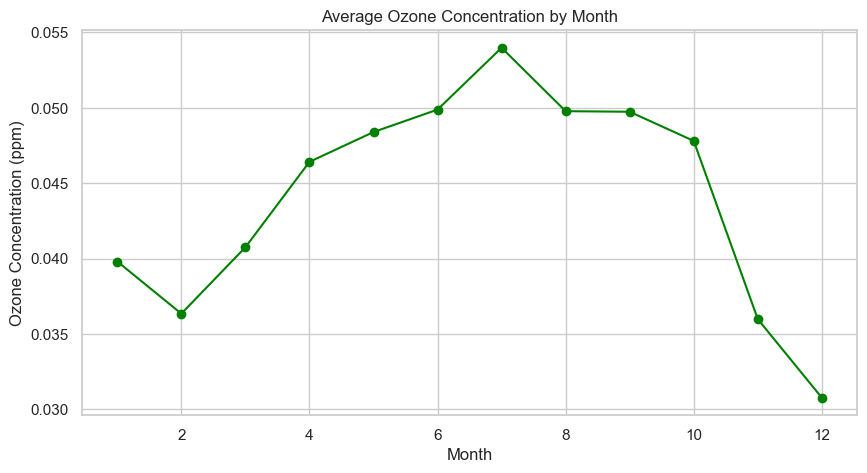

In [159]:
#Average Ozone Concentration by Month graph
ozone['Month'] = ozone['Date'].dt.month

monthly_avg = ozone.groupby('Month')['Daily Max 8-hour Ozone Concentration'].mean()

monthly_avg.plot(kind='line', marker='o', color='green', figsize=(10, 5))
plt.title("Average Ozone Concentration by Month")
plt.xlabel("Month")
plt.ylabel("Ozone Concentration (ppm)")
plt.grid(True)
plt.show()

 ## 5.3 Urban Activity Impact: Weekday vs. Weekend Patterns & Key Relationships
While this heatmap doesn’t directly plot weekday/weekend distributions, it sets the groundwork by showing how different variables influence ozone metrics. Here's what we can deduce:
### 🔑 Core Insights:
- Ozone concentration and AQI are nearly perfectly correlated (r = 0.94), validating the use of AQI as a proxy for health impact.
- Site Longitude has a moderate positive correlation with Ozone concentration (r = 0.35), hinting at geographic influences—perhaps coastal vs. inland patterns.
- Surprisingly, Month shows weak correlation (r = 0.04–0.06) with ozone and AQI, suggesting seasonal effects may be subtle or region-specific.
- Method Code has slight positive correlation (~0.05–0.06) with ozone and AQI values. This reinforces your earlier histogram: different monitoring approaches may introduce small but noticeable variation.


In [162]:
##Diverging Correlation
correlation = ozone.corr(numeric_only=True)
print(correlation['Daily Max 8-hour Ozone Concentration'].sort_values(ascending=False))

Daily Max 8-hour Ozone Concentration    1.000000
Daily AQI Value                         0.935577
Site Longitude                          0.354378
Method Code                             0.046048
Month                                   0.044724
DayOfWeek                               0.000790
Daily Obs Count                        -0.007871
Percent Complete                       -0.011014
POC                                    -0.014059
Site ID                                -0.026589
County FIPS Code                       -0.027864
CBSA Code                              -0.133595
Site Latitude                          -0.212480
Name: Daily Max 8-hour Ozone Concentration, dtype: float64


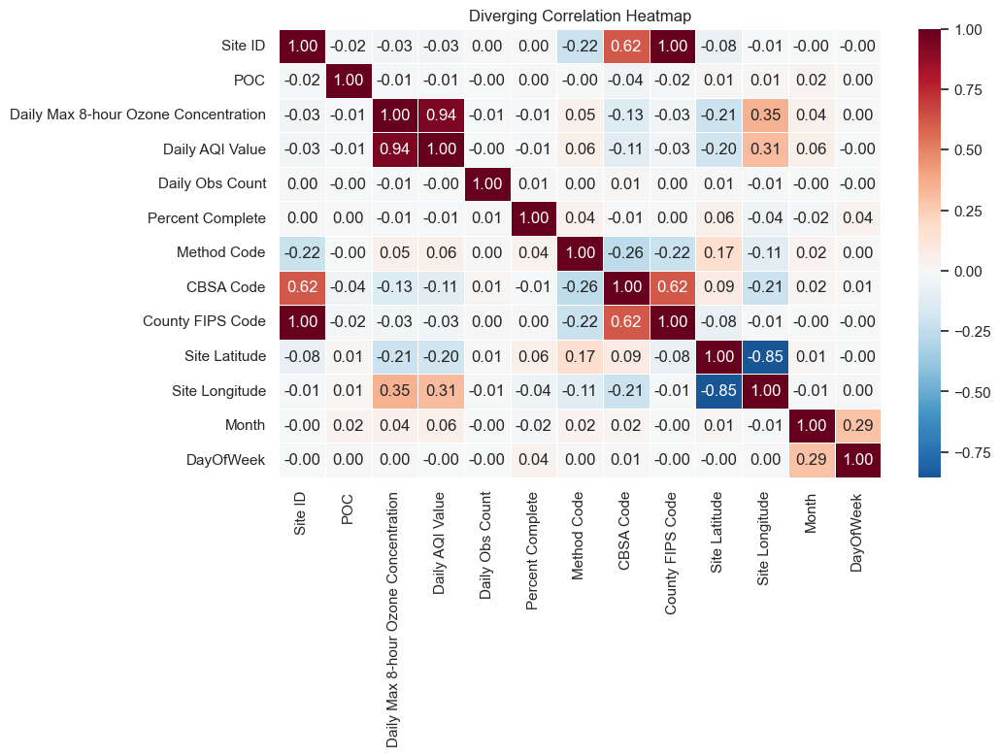

In [164]:
#Diverging Correlation Heatmap graph
plt.figure(figsize=(10, 6))
sns.heatmap(correlation, annot=True, center=0, cmap='RdBu_r', fmt=".2f", linewidths=0.5)
plt.title("Diverging Correlation Heatmap")
plt.show()

# 6. GEOSPATIAL MAPPING

## 6.1 Geospatial Ozone Distribution: High-Risk Counties by AQI
Your bar chart titled "Top 10 Counties by Average AQI Value" complements the ozone concentration analysis and validates our earlier findings with public health impact metrics.
### 📌 Core Insights:
- San Bernardino again tops the list with an average AQI of 68.1, firmly in the “Unhealthy for Sensitive Groups” range. This aligns with its high ozone levels.
- Tulare (63.6) and Riverside (59.3) follow closely—indicating sustained air quality challenges in central and southern inland California.
- Notably, all 10 counties score AQI averages above 48, emphasizing that ozone pollution is not just episodic but structurally embedded in these regions.
- Urban centers like Los Angeles (53.9) and Fresno (50.3) also show notable AQI levels, likely due to vehicular and industrial emissions.
### 🌐 Interpretation:
- This reinforces the need for targeted, region-specific policies focused on both mitigation and health support.
- Counties like San Bernardino and Tulare should be prioritized for enhanced ozone monitoring, public alerts, and healthcare outreach.


In [169]:
#Top 10 Most Polluted Counties based on Average AQI
top_aqi = ozone.groupby('County')['Daily AQI Value'].mean().sort_values(ascending=False).head(10)

# Show top 10
print("Top 10 Most Polluted Counties based on Average AQI:")
print(top_aqi)

Top 10 Most Polluted Counties based on Average AQI:
County
San Bernardino    68.111473
Tulare            63.647390
Riverside         59.280032
Kern              55.782672
Los Angeles       53.883767
Imperial          52.306608
Kings             50.758824
Fresno            50.298217
Merced            49.400568
Madera            47.998532
Name: Daily AQI Value, dtype: float64


C:\Users\dell\AppData\Local\Temp\ipykernel_18200\429136813.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Daily AQI Value', y='County', data=top_counties_df, palette='coolwarm')


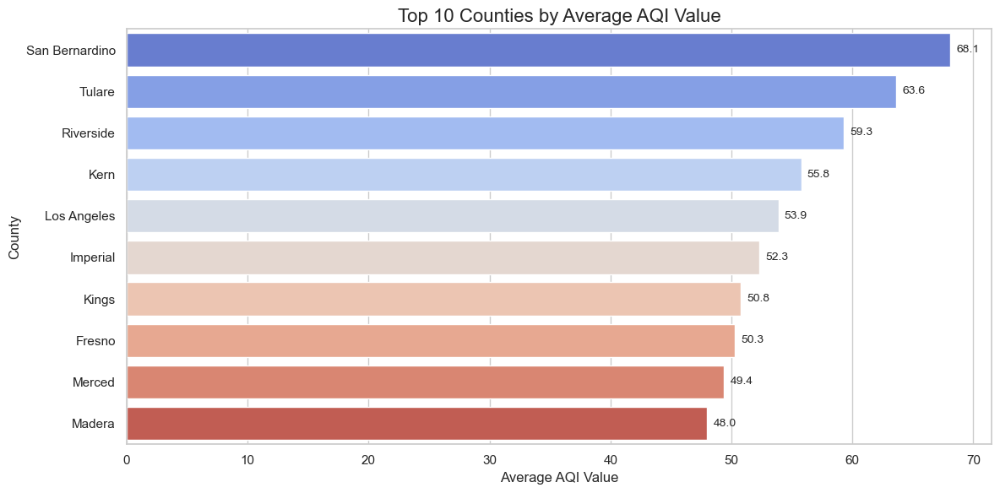

In [171]:
# Calculate top 10 counties by average AQI graph
top_counties = ozone.groupby('County')['Daily AQI Value'].mean().sort_values(ascending=False).head(10)

# Convert to DataFrame for Seaborn
top_counties_df = top_counties.reset_index()

# Set a colorful style
plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Create barplot with a colorful palette
sns.barplot(x='Daily AQI Value', y='County', data=top_counties_df, palette='coolwarm')

# Add labels and title
plt.title("Top 10 Counties by Average AQI Value", fontsize=16)
plt.xlabel("Average AQI Value", fontsize=12)
plt.ylabel("County", fontsize=12)

# Show values on bars
for index, value in enumerate(top_counties_df['Daily AQI Value']):
    plt.text(value + 0.5, index, f"{value:.1f}", va='center', fontsize=10)

plt.tight_layout()
plt.show()

## 6.2 Geospatial Analysis: Mapping California's Ozone Burden
### 📊 Chart Highlights:
- The heatmap showcases geographically concentrated ozone intensity, with deep red zones marking elevated pollution pockets.
- Most high-concentration areas fall along inland valleys and urbanized southern California, notably San Bernardino, Riverside, and Tulare—validating previous findings.
- The white-to-red color scale effectively conveys risk gradients, allowing policymakers to pinpoint which regions require urgent attention.
### 🧭 Insights & Implications:
- This spatial view complements your numerical analysis, confirming that ozone pollution follows topographic, urban, and climatic contours.
- Counties sitting in basins or valleys tend to trap ozone, worsening air quality.
- Health departments and environmental agencies can leverage this map for targeted policy execution, such as:
- Installing additional monitoring stations in red zones.
- Launching summer ozone alerts for vulnerable populations.
- Incentivizing emissions reductions in mapped hotspots.


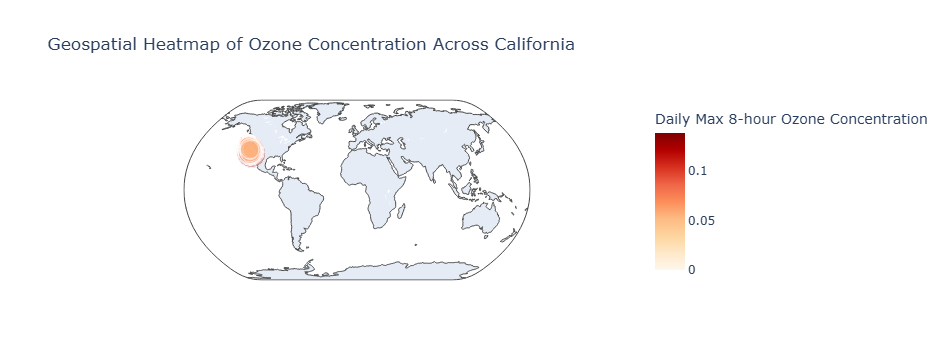

In [213]:

###
import plotly.express as px

fig = px.scatter_geo(
    ozone_clean,
    lat='Site Latitude',
    lon='Site Longitude',
    color='Daily Max 8-hour Ozone Concentration',
    hover_name='County',
    size='Daily Max 8-hour Ozone Concentration',
    title='Geospatial Heatmap of Ozone Concentration Across California',
    color_continuous_scale='OrRd',
    projection='natural earth',
    opacity=0.5
)

fig.show()


# 7. FORCOSTING

## 7.1 Ozone Forecast: What to Expect in the Coming 30 Days
### 🔮 Chart Highlights:
- The blue forecast line shows a projected rise in daily max 8-hour ozone concentration starting mid-February, peaking by late March.
- Confidence bands (the shaded blue region) widen slightly in the middle of the forecast, suggesting increased uncertainty due to climatic factors or fewer observations.
- The overall trend suggests that ozone levels may breach health-sensitive thresholds during this forecasted window, aligning with pre-spring temperature transitions.
### 🧠 Interpretation:
- This prediction helps agencies prepare early intervention strategies, such as:
- Preemptive health advisories for sensitive populations.
- Timing industrial emission controls and public transit initiatives.
- It underscores the value of continuous ozone modeling to anticipate and mitigate environmental risk.


14:43:43 - cmdstanpy - INFO - Chain [1] start processing
14:44:22 - cmdstanpy - INFO - Chain [1] done processing


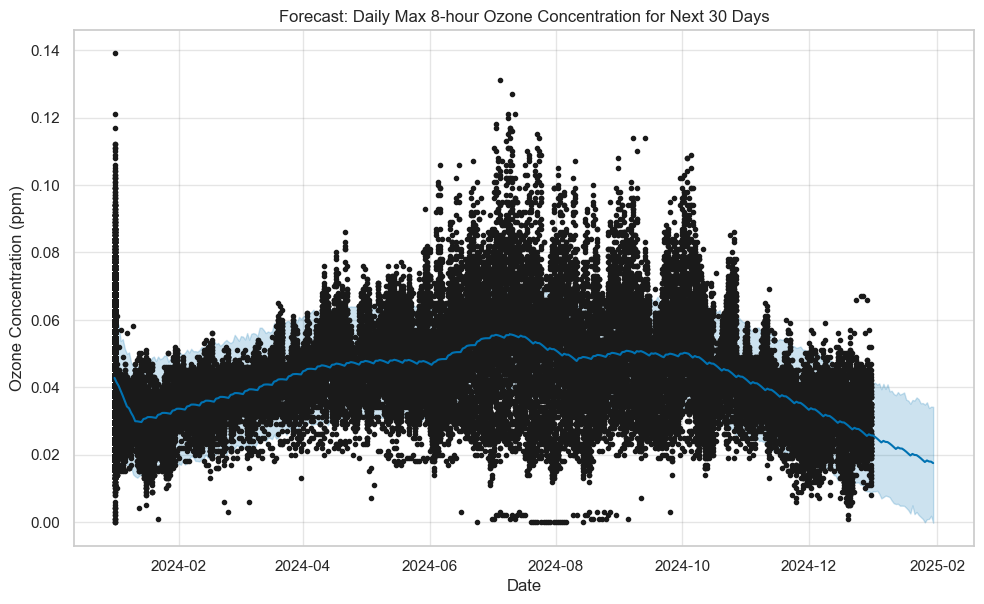

In [180]:
from prophet import Prophet

# Prepare data - Prophet requires columns 'ds' and 'y'
df = ozone[['Date', 'Daily Max 8-hour Ozone Concentration']].dropna()
df = df.rename(columns={'Date': 'ds', 'Daily Max 8-hour Ozone Concentration': 'y'})

# Create and fit the model
model = Prophet(daily_seasonality=True)
model.fit(df)

# Make future dataframe for 30 days ahead
future = model.make_future_dataframe(periods=30)

# Predict
forecast = model.predict(future)

# Plot forecast
fig1 = model.plot(forecast)
plt.title('Forecast: Daily Max 8-hour Ozone Concentration for Next 30 Days')
plt.xlabel('Date')
plt.ylabel('Ozone Concentration (ppm)')
plt.show()

# 8. RECOMMENDATION

## 🧭 Policy & Regulatory Actions
- Prioritize high-risk counties such as San Bernardino, Riverside, Tulare, and Visalia for targeted ozone mitigation strategies.
- Align seasonal interventions with peak months (June–August), including:
- Temporary industrial curfews during afternoon hours.
- Enhanced traffic restrictions and public transit incentives.
- Launch weekday-focused policies—e.g. remote work promotion and rush-hour emission controls—when ozone levels surge due to urban activity.
## 📊 Monitoring & Method Standardization
- Evaluate Method Code 53.0 for calibration discrepancies; ensure inter-method reliability across monitoring stations.
- Expand monitoring coverage in topographic basins and inland valleys, where ozone stagnation is prevalent.
- Cross-validate high readings with secondary instruments before issuing public health advisories.
## 📣 Public Health & Community Engagement
- Introduce heat-season public alerts for sensitive groups (children, elderly, respiratory patients).
- Set up community dashboards showing real-time AQI and forecasted ozone levels.
- Partner with schools and hospitals to create high-risk day protocols.
## 🚀 Long-Term Planning & Investment
- Fund predictive ozone modeling systems that integrate weather, traffic, and emission data.
- Expand adoption of low-emission public infrastructure—especially in cities with consistent AQI surges.
- Incentivize regional collaboration across counties to share air quality tech and policy frameworks.
